## 1. Load the Neural Network model

In [2]:
from __future__ import print_function
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.optim.lr_scheduler import StepLR
from tqdm import tqdm
import datetime
import numpy as np

# Matplotlib
import matplotlib.pyplot as plt
# Pillow
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from sklearn import metrics


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(1, 16, 3, 1)
        self.conv2 = nn.Conv2d(16, 32, 3, 1)
        self.conv3 = nn.Conv2d(32, 64, 3, 1)
        self.conv4 = nn.Conv2d(64, 64, 3, 1)
        self.conv5 = nn.Conv2d(64, 128, 3, 1)
        self.conv6 = nn.Conv2d(128, 128, 3, 1)
        self.conv7 = nn.Conv2d(256, 512, 3, 1)
        self.conv8 = nn.Conv2d(512, 512, 3, 1)
        
        self.dropout1 = nn.Dropout(0.2)
        self.dropout2 = nn.Dropout(0.3)
        self.dropout3 = nn.Dropout(0.4)
        self.fc1 = nn.Linear(100352, 128)
        self.fc3 = nn.Linear(128, 2)
        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.max_pool2d(x,2)
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = F.max_pool2d(x,2)
        x = F.relu(self.conv5(x))
        x = self.dropout1(x)
        x = F.relu(self.conv6(x))
        x = F.relu(self.conv6(x))
        x = torch.flatten(x, 1)
#         print("After flatten:", x.shape)
        x = self.fc1(x)
        #print("After fc1:", x.shape)
        x = F.leaky_relu(x)
        #print("After fc2:", x.shape)
        x = self.fc3(x)
        #print("After fc3:", x.shape)
        output = F.log_softmax(x, dim=1)
        #print("Output:", output.shape)
        return output


def train(args, model, device, train_loader, optimizer, epoch):
    print('training now...')
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        
        output = model(data)
        #print(output.long())
        #print(torch.gt(target, 0))
        
        loss = nn.CrossEntropyLoss()
        loss = loss(output, torch.argmax(target, 1))
        
        loss.backward()
        optimizer.step()
        if batch_idx % args.log_interval == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
            if args.dry_run:
                break
                
    #save model at every epoch, avoid restarting training from scratch when there is an unexpected interruption
    model_name = "cnn_epoch" + str(epoch) + ".pt"
    torch.save(model.state_dict(), model_name)

    return loss.item()


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            
#             test_loss += F.nll_loss(output, torch.argmax(target.long(), 1), reduction='sum').item()  # sum up batch loss
#             pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            
            test_loss += nn.CrossEntropyLoss()(output, torch.argmax(target.long(), 1)).item()
#             print(f"This is test_loss: {test_loss}")
            pred = output.argmax(dim=1, keepdim=True)
#             print(f"This is pred: {pred}")
#             print(torch.argmax(target, 1))
#             print(pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item())

#             correct += pred.eq(target.view_as(pred)).sum().item()
            correct += pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)

    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
  
    return 100. * correct / len(test_loader.dataset), test_loss


def validate(model, device, val_loader):
    model.eval()
    val_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in val_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            
#             test_loss += F.nll_loss(output, torch.argmax(target.long(), 1), reduction='sum').item()  # sum up batch loss
#             pred = output.argmax(dim=1, keepdim=True)  # get the index of the max log-probability
            
            val_loss += nn.CrossEntropyLoss()(output, torch.argmax(target.long(), 1)).item()
#             print(f"This is test_loss: {test_loss}")
            pred = output.argmax(dim=1, keepdim=True)
#             print(f"This is pred: {pred}")
#             print(torch.argmax(target, 1))
#             print(pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item())

#             correct += pred.eq(target.view_as(pred)).sum().item()
            correct += pred.eq(torch.argmax(target, 1).view_as(pred)).sum().item()

    val_loss /= len(val_loader.dataset)

    print('\nValidation set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        val_loss, correct, len(val_loader.dataset),
        100. * correct / len(val_loader.dataset)))
    
    return 100. * correct / len(val_loader.dataset), val_loss


class args:
  batch_size = 16 #'input batch size for training (default: 32)')
  test_batch_size = 1000 #'input batch size for testing (default: 1000)')
  epochs = 14 #'number of epochs to train (default: 14)') # 9~10 is good actually
  lr = 0.6 #'learning rate (default: 1.0)')
  gamma = 0.7 #'Learning rate step gamma (default: 0.7)')
  no_cuda = False #'disables CUDA training')
  dry_run = False #'quickly check a single pass')
  seed = 1 #'random seed (default: 1)')
  log_interval = 1000 #'how many batches to wait before logging training status')
  save_model = True #'For Saving the current Model')

use_cuda = not args.no_cuda and torch.cuda.is_available()

torch.manual_seed(args.seed)

device = torch.device("cuda" if use_cuda else "cpu")

train_kwargs = {'batch_size': args.batch_size}
test_kwargs = {'batch_size': args.test_batch_size}
if use_cuda:
    cuda_kwargs = {'num_workers': 1,
                   'pin_memory': True,
                   'shuffle': True}
    train_kwargs.update(cuda_kwargs)
    test_kwargs.update(cuda_kwargs)

## 2.1 Validation dataset, normal vs infected (covid + non-covid)

In [6]:
class Lung_Val_Dataset(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'normal', 1: 'infected'}
        
        # The dataset consists only of validation images
        self.groups = 'val'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'val_normal': 8,\
                                'val_infected': 17}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'val_normal': './dataset_he/val/normal/',\
                              'val_infected': './dataset_he/val/not_normal/'}
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the validation dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal' or 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        
        if index < first_val:
            class_val = 'normal'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'infected'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

## 2.2 Validation dataset, covid vs non-covid

In [7]:
class Lung_Val_Dataset_Infected(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'infected', 1: 'covid'}
        
        # The dataset consists only of validation images
        self.groups = 'val'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'val_infected': 8,\
                                'val_covid': 9}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'val_infected': './dataset_he/val/infected/non-covid/',\
                              'val_covid': './dataset_he/val/infected/covid/'}
        
    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the validation dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal' or 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        
        if index < first_val:
            class_val = 'infected'
            label = torch.Tensor([1, 0])
        else:
            class_val = 'covid'
            index = index - first_val
            label = torch.Tensor([0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

## 2.3 Validation dataset, for testing all validation images

In [8]:
class Final_Testing_Dataset(Dataset):
    
    def __init__(self):
        """
        Constructor for generic Dataset class - simply assembles
        the important parameters in attributes.
        """
        
        # All images are of size 150 x 150
        self.img_size = (150, 150)
        
        # Three classes will be considered here (normal, infected and covid)
        self.classes = {0: 'normal', 1: 'infected', 2: 'covid'}
        
        # The dataset consists only of test images
        self.groups = 'val'
        
        # Number of images in each part of the dataset
        self.dataset_numbers = {'val_normal': 8,\
                                'val_infected': 8, \
                                'val_covid': 9}
        
        # Path to images for different parts of the dataset
        self.dataset_paths = {'val_normal': './dataset_he/val/normal/', \
                              'val_infected': './dataset_he/val/infected/non-covid/', \
                              'val_covid': './dataset_he/val/infected/covid/'}
        

    def describe(self):
        """
        Descriptor function.
        Will print details about the dataset when called.
        """
        
        # Generate description
        msg = "This is the test dataset of the Lung Dataset"
        msg += " used for the Small Project in the 50.039 Deep Learning class"
        msg += " in Feb-March 2021. \n"
        msg += "It contains a total of {} images, ".format(sum(self.dataset_numbers.values()))
        msg += "of size {} by {}.\n".format(self.img_size[0], self.img_size[1])
        msg += "The images are stored in the following locations "
        msg += "and each one contains the following number of images:\n"
        for key, val in self.dataset_paths.items():
            msg += " - {}, in folder {}: {} images.\n".format(key, val, self.dataset_numbers[key])
        print(msg)
        
    
    def open_img(self, group_val, class_val, index_val):
        """
        Opens image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal', 'infected' or 'covid'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        
        Returns loaded image as a normalized Numpy array.
        """
        
        # Asserts checking for consistency in passed parameters
        err_msg = "Error - group_val variable should be set to 'train', 'test' or 'val'."
        assert group_val in self.groups, err_msg
        
        err_msg = "Error - class_val variable should be set to 'normal', 'infected' or 'covid'."
        assert class_val in self.classes.values(), err_msg
        
        max_val = self.dataset_numbers['{}_{}'.format(group_val, class_val)]
        err_msg = "Error - index_val variable should be an integer between 0 and the maximal number of images."
        err_msg += "\n(In {}/{}, you have {} images.)".format(group_val, class_val, max_val)
        assert isinstance(index_val, int), err_msg
        assert index_val >= 0 and index_val <= max_val, err_msg
        
        # Open file as before
        path_to_file = '{}/{}.jpg'.format(self.dataset_paths['{}_{}'.format(group_val, class_val)], index_val)
        with open(path_to_file, 'rb') as f:
            im = np.asarray(Image.open(f))/255
        f.close()
        return im
    
    
    def show_img(self, group_val, class_val, index_val):
        """
        Opens, then displays image with specified parameters.
        
        Parameters:
        - group_val should take values in 'train', 'test' or 'val'.
        - class_val variable should be set to 'normal' or 'infected'.
        - index_val should be an integer with values between 0 and the maximal number of images in dataset.
        """
        
        # Open image
        im = self.open_img(group_val, class_val, index_val)
        
        # Display
        plt.imshow(im)
        
        
    def __len__(self):
        """
        Length special method, returns the number of images in dataset.
        """
        
        # Length function
        return sum(self.dataset_numbers.values())
    
    
    def __getitem__(self, index):
        """
        Getitem special method.
        
        Expects an integer value index, between 0 and len(self) - 1.
        
        Returns the image and its label as a one hot vector, both
        in torch tensor format in dataset.
        """
        # Get item special method
        first_val = int(list(self.dataset_numbers.values())[0])
        second_val = first_val + int(list(self.dataset_numbers.values())[1])
        if index < first_val:
            class_val = 'normal'
            label = torch.Tensor([1, 0, 0])
        elif index >= first_val and index < second_val:
            class_val = 'infected'
            index = index - first_val
            label = torch.Tensor([0, 1, 0])
        else:
            class_val = 'covid'
            index = index - second_val
            label = torch.Tensor([0, 0, 1])
        im = self.open_img(self.groups, class_val, index)
        im = transforms.functional.to_tensor(np.array(im)).float()
        return im, label

In [9]:
ld_val = Lung_Val_Dataset()
ld_val_infected = Lung_Val_Dataset_Infected()
ld_final_test = Final_Testing_Dataset()

## 3.1 Test model 1, normal vs infected (covid + non-covid) images

Average performance: 21/25 = 84.0%


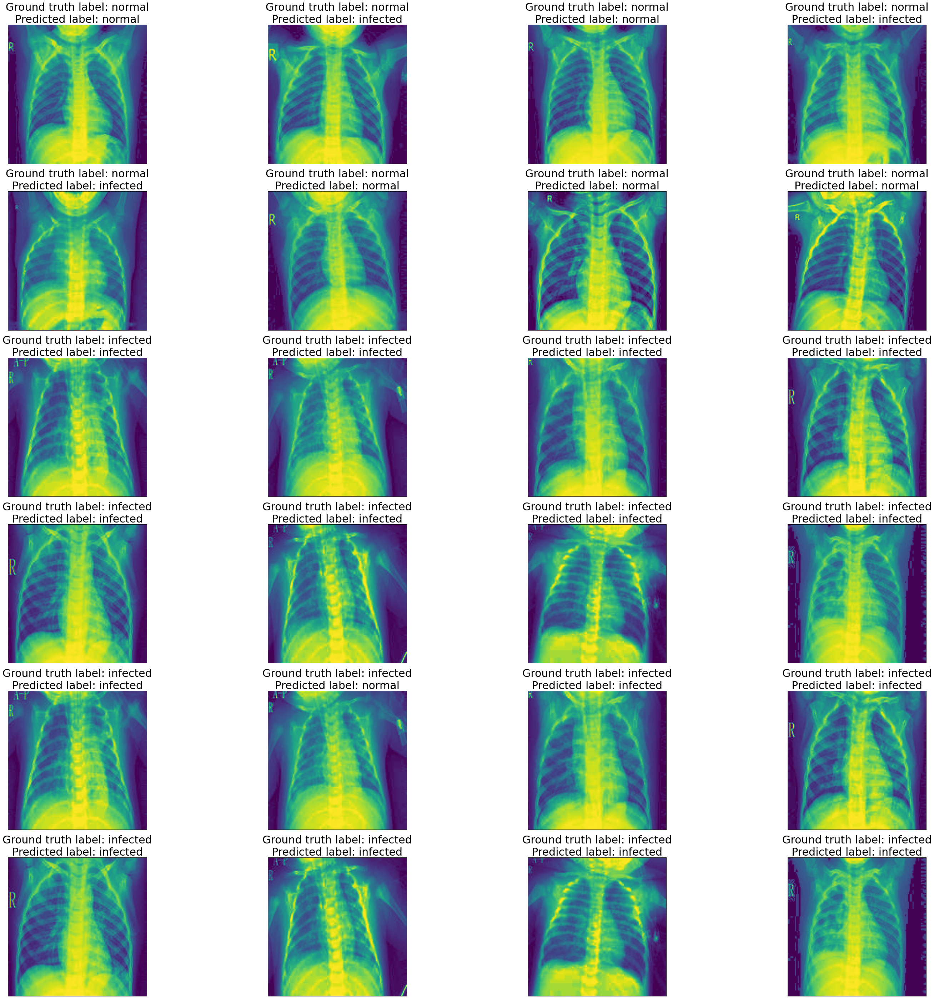

[[16  1]
 [ 3  5]]
              precision    recall  f1-score   support

    infected      0.842     0.941     0.889        17
      normal      0.833     0.625     0.714         8

    accuracy                          0.840        25
   macro avg      0.838     0.783     0.802        25
weighted avg      0.839     0.840     0.833        25



In [10]:
model = Net().to(device)
model.load_state_dict(torch.load("./binaryclass_cnn1.pt"))
classes = {0: 'normal', 1: 'infected'}

val_loader = DataLoader(ld_val, batch_size = 1, shuffle = False)
val_pred_list = []
with torch.no_grad():
    for data, target in val_loader: 
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        val_pred_list.append(classes[int(pred)])
    

class_val = ["normal","normal","normal","normal","normal","normal","normal","normal",
             "infected","infected","infected","infected","infected","infected","infected","infected",
            "infected","infected","infected","infected","infected","infected","infected","infected", "infected"]
accuracy = 0
for label_index in range(len(val_pred_list)):
    if (val_pred_list[label_index] == class_val[label_index]):
        accuracy += 1
        
print("Average performance: " + str(accuracy) + "/" + str(len(val_pred_list)) + " = " + str(100 * accuracy/len(val_pred_list)) + "%")

f = plt.figure(figsize=(50, 50))
axes = []

for a in range(3*8):
    
    classes = class_val[a]

    axes.append(f.add_subplot(6, 4, a+1))
    
    plt.xticks([], [])
    plt.yticks([], [])
    
    subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred_list[a])
    axes[-1].set_title(subplot_title, size = 30)
    ld_val.show_img("val", classes, a%8)
    

plt.show()

print(metrics.confusion_matrix(class_val, val_pred_list))
print(metrics.classification_report(class_val, val_pred_list, digits=3))

## 3.2 Test model 2, covid vs non-covid images

Average performance: 13/17 = 76.47058823529412%


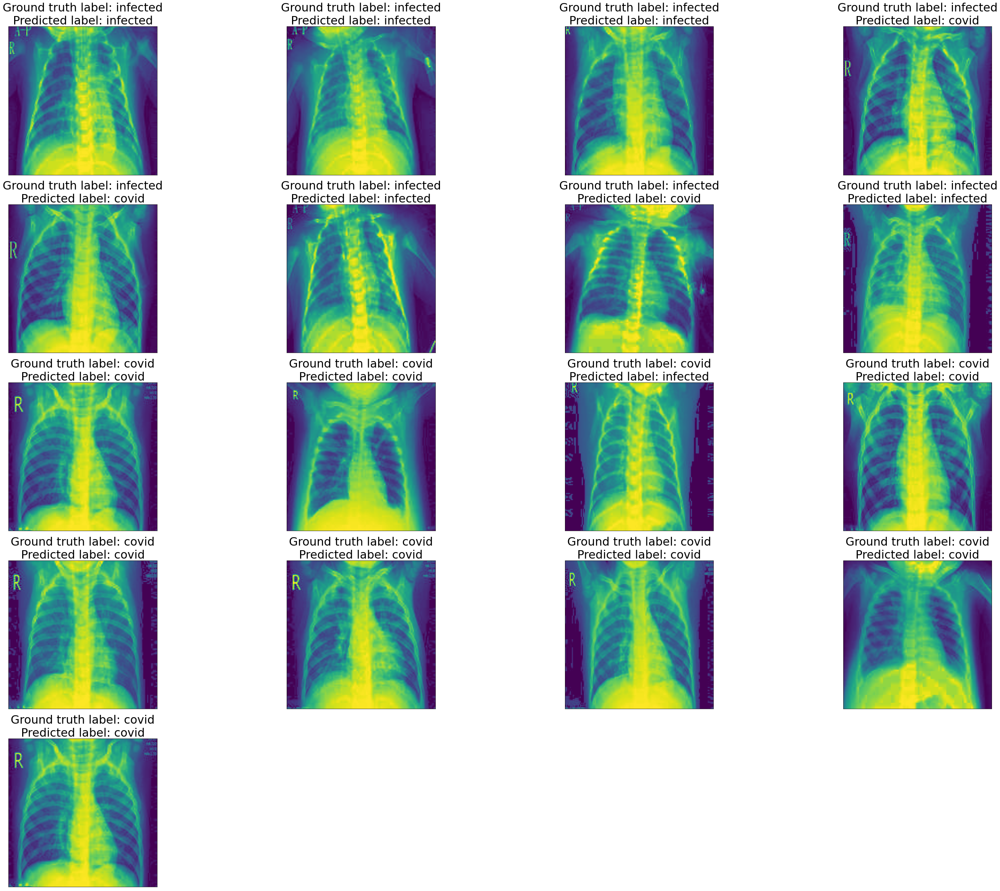

[[8 1]
 [3 5]]
              precision    recall  f1-score   support

       covid      0.727     0.889     0.800         9
    infected      0.833     0.625     0.714         8

    accuracy                          0.765        17
   macro avg      0.780     0.757     0.757        17
weighted avg      0.777     0.765     0.760        17



In [11]:
model = Net().to(device)
model.load_state_dict(torch.load("./binaryclass_cnn2.pt"))
classes = {0: 'infected', 1: 'covid'}

val_loader = DataLoader(ld_val_infected, batch_size = 1, shuffle = False)
val_pred_list = []
with torch.no_grad():
    for data, target in val_loader: 
        data, target = data.to(device), target.to(device)
        output = model(data)
        pred = output.argmax(dim=1, keepdim=True)
        val_pred_list.append(classes[int(pred)])
    

class_val = ["infected","infected","infected","infected","infected","infected","infected","infected",
            "covid","covid","covid","covid","covid","covid","covid","covid", "covid"]
accuracy = 0
for label_index in range(len(val_pred_list)):
    if (val_pred_list[label_index] == class_val[label_index]):
        accuracy += 1
        
print("Average performance: " + str(accuracy) + "/" + str(len(val_pred_list)) + " = " + str(100 * accuracy/len(val_pred_list)) + "%")

f = plt.figure(figsize=(50, 50))
axes = []

for a in range(17):
    
    classes = class_val[a]

    axes.append(f.add_subplot(6, 4, a+1))
    
    plt.xticks([], [])
    plt.yticks([], [])
    
    subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred_list[a])
    axes[-1].set_title(subplot_title, size = 30)
    ld_val_infected.show_img("val", classes, a%8)
    

plt.show()

print(metrics.confusion_matrix(class_val, val_pred_list))
print(metrics.classification_report(class_val, val_pred_list, digits=3))

## 3.3 Combine both models to get 2 binary classifiers

This method is aimed to classify whether a person is healthy, has pneumonia (no covid) or has covid. It is achieved through the use of two binary classifiers. In the code cell below, if the output of the first binary classifier tells us that an image is an image of someone who is infected, we will pass that image through the second classifier to classify if the person is infected with covid or pneumonia without covid.

Model 1 statistics:

Validation set: Average loss: 0.2679, Accuracy: 23/25 (92%)

Model 2 statistics:

Validation set: Average loss: 0.6122, Accuracy: 13/17 (76%)

Combined models, average performance: 10/25 = 40.0%


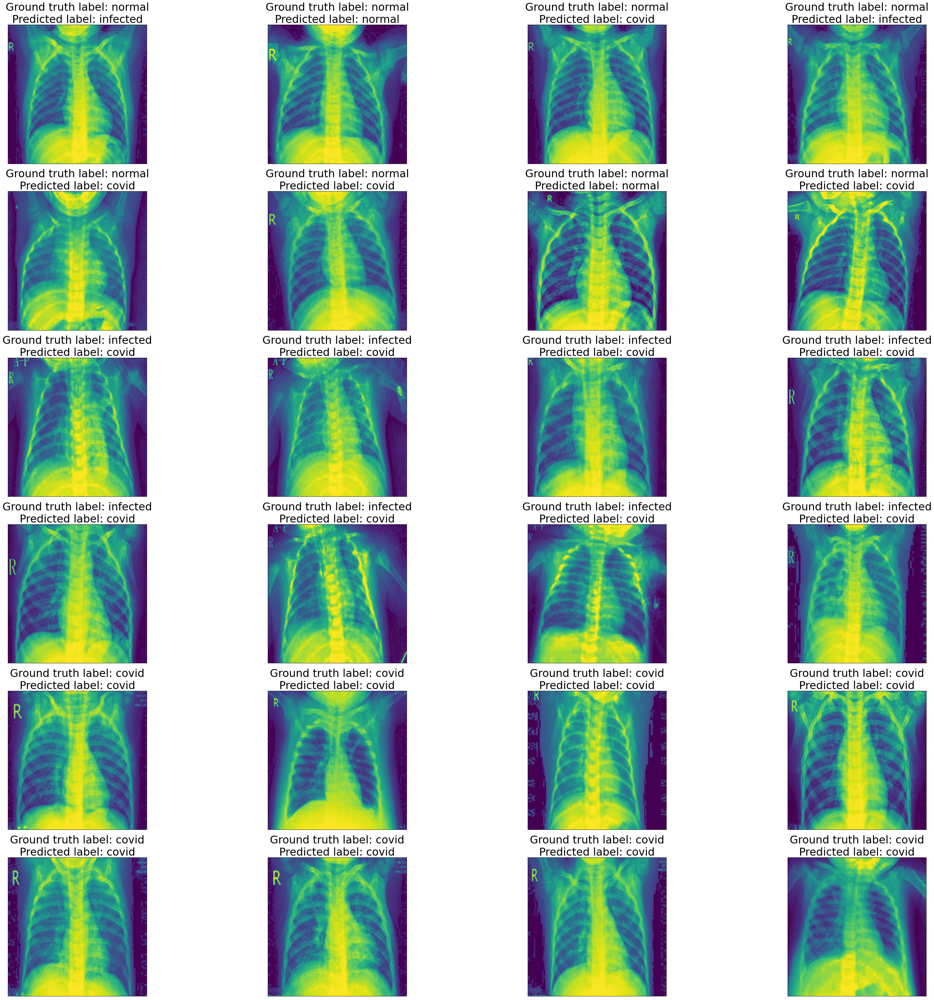

In [17]:
def loader_function(model1_abs_path, model2_abs_path):
    '''
    Input:
    - absolute path of model 1
    - absolute path of model 2
    
    This function uses model 1 to predict the validation set normal and infected images. From there, images that are classified
    as infected will go through the second model to be predicted.
    
    Once prediction is complete, function will print the images with their ground truth label and the predicted label
    '''
    class args:
      batch_size = 16 #'input batch size for training (default: 32)')
      test_batch_size = 1000 #'input batch size for testing (default: 1000)')
      epochs = 14 #'number of epochs to train (default: 14)') # 9~10 is good actually
      lr = 0.8 #'learning rate (default: 1.0)')
      gamma = 0.7 #'Learning rate step gamma (default: 0.7)')
      no_cuda = False #'disables CUDA training')
      dry_run = False #'quickly check a single pass')
      seed = 1 #'random seed (default: 1)')
      log_interval = 1000 #'how many batches to wait before logging training status')
      save_model = True #'For Saving the current Model')

    use_cuda = not args.no_cuda and torch.cuda.is_available()
    device = torch.device("cuda" if use_cuda else "cpu")

    ####### MODEL 1 #######
    model1 = Net().to(device)
    model1.load_state_dict(torch.load(model1_abs_path))

    bs_val = 1
    # Dataloader from dataset (test and val)
    # test_loader = DataLoader(ld_test, batch_size = bs_val, shuffle = True)
    val_loader = DataLoader(ld_val, batch_size = bs_val, shuffle = True)

    val_loss_list = []
    val_accuracy_list = []
#     test_loss_list = []
#     test_accuracy_list = []
    
    print("Model 1 statistics:")
#     test_accuracy, test_loss = test(model1, device, test_loader)
#     test_loss_list.append(test_loss)
#     test_accuracy_list.append(test_accuracy)

    val_accuracy, val_loss = validate(model1, device, val_loader)
    val_loss_list.append(val_loss)
    val_accuracy_list.append(val_accuracy)
    
    ####### MODEL 2 #######
    model2 = Net().to(device)
    model2.load_state_dict(torch.load(model2_abs_path))

    # Dataloader from dataset (test and val)
    # test_loader_infected = DataLoader(ld_test_infected, batch_size = bs_val, shuffle = True)
    val_loader_infected = DataLoader(ld_val_infected, batch_size = bs_val, shuffle = True)

    val_loss_list_infected = []
    val_accuracy_list_infected = []
    # test_loss_list_infected = []
    # test_accuracy_list_infected = []

    print("Model 2 statistics:")
#     test_accuracy_infected, test_loss_infected = test(model2, device, test_loader_infected)
#     test_loss_list_infected.append(test_loss_infected)
#     test_accuracy_list_infected.append(test_accuracy_infected)

    val_accuracy_infected, val_loss_infected = validate(model2, device, val_loader_infected)
    val_loss_list_infected.append(val_loss_infected)
    val_accuracy_list_infected.append(val_accuracy_infected)
    
    
    final_test_loader = DataLoader(ld_final_test, batch_size = bs_val, shuffle=True)
    
    # PREDICT AND PRINT THE IMAGES    
    classes_orig = {0: 'normal', 1: 'infected', 2: 'covid'}
    classes1 = {0: 'normal', 1: 'infected'}
    classes2 = {0: 'infected', 1: 'covid'}
    
    val_pred = []
    
    class_val = ["normal", "normal", "normal", "normal", "normal", "normal", "normal", "normal", 
                 "infected", "infected", "infected", "infected", "infected", "infected", "infected", "infected",
                 "covid", "covid", "covid", "covid", "covid", "covid", "covid", "covid", "covid"]
    
    with torch.no_grad():
        for data, target in final_test_loader: 
            data, target = data.to(device), target.to(device)
            output = model1(data)
            pred = output.argmax(dim=1, keepdim=True)
            
            if (classes1[int(pred)] == 'infected'):
                output = model2(data)
                pred = output.argmax(dim=1, keepdim=True)
                val_pred.append(classes2[int(pred)])
                
            else:
                val_pred.append(classes1[int(pred)])
    
    accuracy = 0
    
    f = plt.figure(figsize=(50, 50))
    axes = []

    for a in range(8):

        classes = class_val[a]

        axes.append(f.add_subplot(6, 4, a+1))

        plt.xticks([], [])
        plt.yticks([], [])

        subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred[a])
        axes[-1].set_title(subplot_title, size = 30)
        ld_val.show_img("val", classes, a%8)

    for b in range(8, 24):
        classes = class_val[b]
        
        axes.append(f.add_subplot(6, 4, b+1))
        
        plt.xticks([], [])
        plt.yticks([], [])
        
        subplot_title = ("Ground truth label: " + classes + "\nPredicted label: " + val_pred[a])
        axes[-1].set_title(subplot_title, size = 30)
        ld_val_infected.show_img("val", classes, b%8)
        
#     print(len(val_pred), val_pred)
#     print(len(class_val), class_val)
    for label_index in range(len(val_pred)):
        if (val_pred[label_index] == class_val[label_index]):
            accuracy += 1


    print("Combined models, average performance: " + str(accuracy) + "/" + str(len(val_pred)) + " = " + str(100 * accuracy/len(val_pred)) + "%")
    plt.show()


    
loader_function(model1_abs_path='./binaryclass_cnn1.pt', model2_abs_path='./binaryclass_cnn2.pt')